<a href="https://colab.research.google.com/github/Felipe-Pinto/python_para_exatas/blob/main/CN_Projeto5_A3D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Construindo gráficos 3D: Eixos

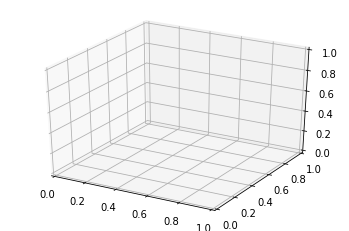

In [ ]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure()
ax = plt.axes(projection='3d')

# 2. Gráficos de dispersão 3D

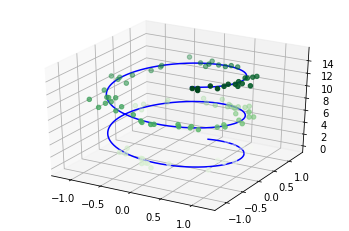

In [ ]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = np.linspace(0, 15, 1000)
xline = np.sin(zline)
yline = np.cos(zline)
ax.plot3D(xline, yline, zline, 'blue')

# Data for three-dimensional scattered points
zdata = 15 * np.random.random(100)
xdata = np.sin(zdata) + 0.1 * np.random.randn(100)
ydata = np.cos(zdata) + 0.1 * np.random.randn(100)
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');

# 3. Gráficos de grade: curvas de nível

## 3.1. Criando uma grade a partir de uma função 3D

In [ ]:
def f(x, y):
    return np.sin(np.sqrt(x ** 2 + y ** 2))

x = np.linspace(-6, 6, 30)
y = np.linspace(-6, 6, 30)
z = f(x,y)

X, Y = np.meshgrid(x, y)
Z = f(X, Y)
Z

array([[ 8.07261091e-01,  9.41437765e-01,  9.97705708e-01,
         9.80850719e-01,  9.02160390e-01,  7.77003505e-01,
         6.22348946e-01,  4.54593535e-01,  2.87954298e-01,
         1.33543814e-01, -8.84706779e-04, -1.10640850e-01,
        -1.93431827e-01, -2.48533645e-01, -2.75989644e-01,
        -2.75989644e-01, -2.48533645e-01, -1.93431827e-01,
        -1.10640850e-01, -8.84706779e-04,  1.33543814e-01,
         2.87954298e-01,  4.54593535e-01,  6.22348946e-01,
         7.77003505e-01,  9.02160390e-01,  9.80850719e-01,
         9.97705708e-01,  9.41437765e-01,  8.07261091e-01],
       [ 9.41437765e-01,  9.98937218e-01,  9.71132423e-01,
         8.69941049e-01,  7.12998635e-01,  5.20584150e-01,
         3.12742785e-01,  1.07000578e-01, -8.30932252e-02,
        -2.48533645e-01, -3.84629319e-01, -4.90176225e-01,
        -5.66292335e-01, -6.15169883e-01, -6.38962142e-01,
        -6.38962142e-01, -6.15169883e-01, -5.66292335e-01,
        -4.90176225e-01, -3.84629319e-01, -2.48533645e-

## 3.2. Utilizando as curvas de nível

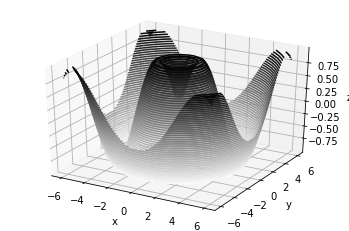

In [ ]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, Z, 50, cmap='binary')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
plt.show()

## 3.3. Trocando o ângulo da câmera

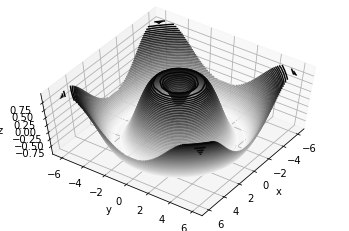

In [ ]:
ax.view_init(60, 35)
fig

## 3.4. Criando uma animação

In [ ]:
from matplotlib import animation

def init():
    ax.scatter(X, Y, Z, marker='o', s=20, c="goldenrod", alpha=0.6)
    return fig,

def animate(i):
    ax.view_init(elev=10., azim=i)
    return fig,

# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=360, interval=20, blit=True)

# Save
anim.save('basic_animation.mp4', fps=30, extra_args=['-vcodec', 'libx264'])

## 3.5. Tocando no google colab o vídeo criado

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('basic_animation.mp4','rb').read()
data_url = "data:basic_animation/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## 3.6 Baixando o arquivo da animação

In [ ]:
from google.colab import files
files.download('basic_animation.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 4. Outros estilos de gráficos

## 4.1 Gráficos de malha

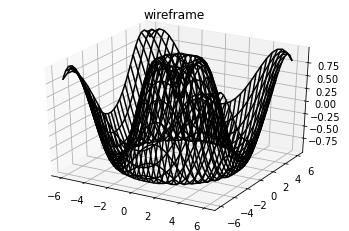

In [ ]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_wireframe(X, Y, Z, color='black')
ax.set_title('wireframe')
plt.show()

## 4.2. Gráficos de superfície

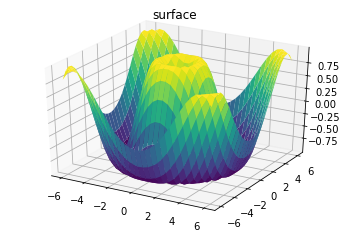

In [ ]:
ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
ax.set_title('surface')
plt.show()

## 4.3 Gráficos de pontos coloridos: mapas de cores

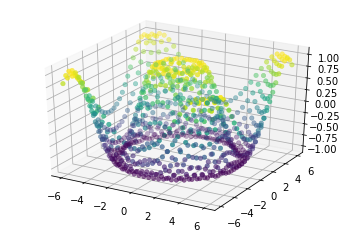

In [ ]:
ax = plt.axes(projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis', linewidth=0.5)
plt.show()

# 5. Tipos de mapas de cores

## 5.1. Mapas de cores pré-definidos

In [ ]:
from branca.colormap import linear

linear

viridis
Pastel1_03
Pastel1_05
Pastel1_04
Pastel1_07


## 5.2. Redefinindo escala de cores

In [ ]:
colormap = linear.YlOrRd_09.scale(0.2,0.8)
colormap

## 5.3. Criando a sua escala de cores

In [ ]:
import branca.colormap as cm
colormap = cm.LinearColormap(colors=['yellow','orange','red'], index=[0.2,0.4,0.8],vmin=0.2,vmax=0.8)
colormap

In [ ]:
import branca.colormap as cm
colormap = cm.LinearColormap(colors=['green','yellow','orange','red','purple'], index=[0.2,0.4,0.5,0.6,0.8],vmin=0.2,vmax=0.8)
colormap